# [VQ-VAE](https://arxiv.org/abs/1711.00937) by  [Aäron van den Oord](https://twitter.com/avdnoord) et al. in PyTorch

## Introduction

Variational Auto Encoders (VAEs) can be thought of as what all but the last layer of a neural network is doing, namely feature extraction or seperating out the data. Thus given some data we can think of using a neural network for representation generation. 

Recall that the goal of a generative model is to estimate the probability distribution of high dimensional data such as images, videos, audio or even text by learning the underlying structure in the data as well as the dependencies between the different elements of the data. This is very useful since we can then use this representation to generate new data with similar properties. This way we can also learn useful features from the data in an unsupervised fashion.

The VQ-VAE uses a discrete latent representation mostly because many important real-world objects are discrete. For example in images we might have categories like "Cat", "Car", etc. and it might not make sense to interpolate between these categories. Discrete representations are also easier to model since each category has a single value whereas if we had a continous latent space then we will need to normalize this density function and learn the dependencies between the different variables which could be very complex.

### Code

I have followed the code from the TensorFlow implementation by the author which you can find here [vqvae.py](https://github.com/deepmind/sonnet/blob/master/sonnet/python/modules/nets/vqvae.py) and [vqvae_example.ipynb](https://github.com/deepmind/sonnet/blob/master/sonnet/examples/vqvae_example.ipynb). 

Another PyTorch implementation is found at [pytorch-vqvae](https://github.com/ritheshkumar95/pytorch-vqvae).


## Basic Idea

The overall architecture is summarized in the diagram below:

![](images/vq-vae.png)

We start by defining a latent embedding space of dimension `[K, D]` where `K` are the number of embeddings and `D` is the dimensionality of each latent embeddng vector, i.e. $e_i \in \mathbb{R}^{D}$. The model is comprised of an encoder and a decoder. The encoder will map the input to a sequence of discrete latent variables, whereas the decoder will try to reconstruct the input from these latent sequences. 

More preciesly, the model will take in batches of RGB images,  say $x$, each of size 32x32 for our example, and pass it through a ConvNet encoder producing some output $E(x)$, where we make sure the channels are the same as the dimensionality of the latent embedding vectors. To calculate the discrete latent variable we find the nearest embedding vector and output it's index. 

The input to the decoder is the embedding vector corresponding to the index which is passed through the decoder to produce the reconstructed image. 

Since the nearest neighbour lookup has no real gradient in the backward pass we simply pass the gradients from the decoder to the encoder  unaltered. The intuition is that since the output representation of the encoder and the input to the decoder share the same `D` channel dimensional space, the gradients contain useful information for how the encoder has to change its output to lower the reconstruction loss.

## Loss

The total loss is actually composed of three components

1. **reconstruction loss**: which optimizes the decoder and encoder
1. **codebook loss**: due to the fact that gradients bypass the embedding, we use a dictionary learning algorithm  which uses an $l_2$  error to move the embedding vectors $e_i$ towards the encoder output
1. **commitment loss**:  since the volume of the embedding space is dimensionless, it can grow arbirtarily if the embeddings $e_i$ do not train as fast as  the encoder parameters, and thus we add a commitment loss to make sure that the encoder commits to an embedding

In [1]:
#!pip3 install -U -r requirements.txt

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from __future__ import print_function
from einops import rearrange, reduce, repeat


import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import savgol_filter


import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torch.optim as optim

import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchvision.utils import make_grid

from vector_quantize_pytorch import ResidualVQ

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# mps
if torch.backends.mps.is_available():
  device = torch.device("mps")

device

device(type='mps')

## Load Data

In [5]:
from networks.mlp_models import MLP3D
from data.neural_field_datasets_shapenet import AllWeights3D, ModelTransform3D, ImageTransform3D, ShapeNetDataset, FlattenTransform3D, get_neuron_mean_n_std


shapenet = ShapeNetDataset("./datasets/plane_mlp_weights", transform=ImageTransform3D())
shapenet_model = ShapeNetDataset("./datasets/plane_mlp_weights", transform=ModelTransform3D())

In [7]:
# all of shapenet in a single tensor
shapenet_all = torch.stack([shapenet[i][0] for i in range(len(shapenet))], dim=0).squeeze(1)

In [14]:
shapenet_all.flatten().shape

torch.Size([149114880])

In [16]:
pairs = shapenet_all[:(shapenet_all.flatten().shape[0] - shapenet_all.flatten().shape[0]%3)].view(-1, 3)
pairs.shapexw

torch.Size([49704960, 3])

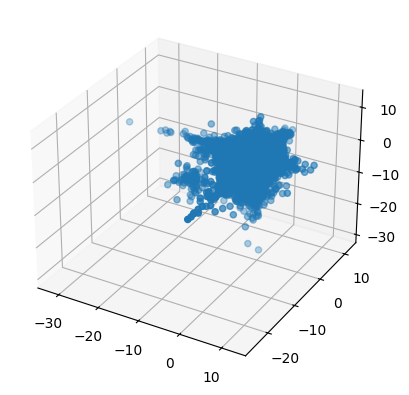

torch.Size([49704960, 3])

In [18]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
# matplotlib scatter plot of pairs
ax.scatter(pairs[:1_000_000,0], pairs[:1_000_000,1], pairs[:1_000_000,2])
plt.show()

pairs.shape

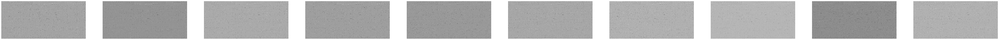

In [ ]:
# visualize the first 10 images
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 10, figsize=(100, 100))
for i in range(10):
    # same color scale for all images
    
    axs[i].imshow(shapenet[i][0].squeeze().numpy(), cmap='gray')
    axs[i].axis('off')

In [ ]:
from tqdm import tqdm
data, label = shapenet[0]
cutoff = 32

indices = []

for sample in tqdm(shapenet):
    data, label = sample
    data = rearrange(data.squeeze(0), "i w -> w i")
    # get initial indices
    indices.append(data.abs().sort(dim=1).indices[:, :cutoff])


100%|██████████| 4045/4045 [00:07<00:00, 519.46it/s]


In [ ]:
indices_tensor = torch.stack(indices)
indices_tensor.shape

torch.Size([4045, 288, 32])

In [ ]:
top_indices = []
for row in rearrange(indices_tensor, "b i w -> i b w"):
    unique, counts = row.flatten().unique(return_counts=True)
    top_indices.append(unique[counts.argsort()[-cutoff:]])

top_indices = torch.stack(top_indices)

In [ ]:
top_indices.shape

torch.Size([288, 32])

In [ ]:
# unique_indices, counts = indices_tensor[:, ].flatten().unique(return_counts=True)
# indices = counts.sort().indices[-64:].shape

In [ ]:
def apply_filter(data):
    data = data.squeeze(0)
    data = rearrange(data, "i w -> w i")
    for i, row in enumerate(top_indices):
        for el in row:
            data[i, el] = 0
    image = rearrange(data, "w i -> i w")
    state_dict = shapenet.transform.inverse(image.unsqueeze(0))

    from networks.mlp_models import MLP3D

    mlp_kwargs = {
        "out_size": 1,
        "hidden_neurons": [128, 128, 128],
        "use_leaky_relu": False,
        "input_dims": 3,
        "multires": 4,
        "include_input": True,
        "output_type": "occ",
    }
    model = MLP3D(**mlp_kwargs)
    model.load_state_dict(state_dict)
    return model

In [ ]:
from utils.visualization3d import visualize_model3d, model_to_mesh
# model = apply_filter(shapenet[723][0])
# mesh, sdf = model_to_mesh(model)
# mesh.show()

model_wo_filter = shapenet_model[723][0]
mesh, sdf = model_to_mesh(model_wo_filter)
mesh.show()


In [ ]:
shapenet[0][0].max()

tensor(8.1207)

In [ ]:
data_variance = 1 # np.var(training_data.data / 255.0)

## Vector Quantizer Layer

This layer takes a tensor to be quantized. The channel dimension will be used as the space in which to quantize. All other dimensions will be flattened and will be seen as different examples to quantize.

The output tensor will have the same shape as the input.

As an example for a `BCHW` tensor of shape `[16, 64, 32, 32]`, we will first convert it to an `BHWC` tensor of shape `[16, 32, 32, 64]` and then reshape it into `[16384, 64]` and all `16384` vectors of size `64`  will be quantized independently. In otherwords, the channels are used as the space in which to quantize. All other dimensions will be flattened and be seen as different examples to quantize, `16384` in this case.

We will also implement a slightly modified version  which will use exponential moving averages to update the embedding vectors instead of an auxillary loss. This has the advantage that the embedding updates are independent of the choice of optimizer for the encoder, decoder and other parts of the architecture. For most experiments the EMA version trains faster than the non-EMA version.

## Encoder & Decoder Architecture

The encoder and decoder architecture is based on a ResNet and is implemented below:

## Train

We use the hyperparameters from the author's code:

In [ ]:
batch_size = 4
num_training_updates = 15000

num_hiddens = 1024
num_residual_hiddens = 32
num_residual_layers = 2

embedding_dim = 64
num_embeddings = 2048

commitment_cost = 0.25

decay = 0 # 0.95

learning_rate = 1e-3

In [ ]:
# Datasplit of 80/20 of shapenet dataset
train_size = int(0.8 * len(shapenet))
test_size = len(shapenet) - train_size
training_data, validation_data = torch.utils.data.random_split(shapenet, [train_size, test_size])

In [ ]:
training_loader = DataLoader(training_data, 
                             batch_size=batch_size, 
                             shuffle=True,
                             pin_memory=True)

In [ ]:
validation_loader = DataLoader(validation_data,
                               batch_size=32,
                               shuffle=True,
                               pin_memory=True)

In [ ]:
def save_checkpoint(model, optimizer, filename):
    state = {
        'state_dict': model.state_dict(),
        'optimizer': optimizer.state_dict()
    }
    torch.save(state, filename)

def load_checkpoint(model, optimizer, filename):
    state = torch.load(filename)
    model.load_state_dict(state['state_dict'])
    optimizer.load_state_dict(state['optimizer'])

    return model, optimizer

In [ ]:
from networks.matrix_vq_vae import Model
model = Model(num_hiddens, num_residual_layers, num_residual_hiddens,
              num_embeddings, embedding_dim, 
              commitment_cost, decay).to(device)

optimizer = optim.Adam(model.parameters(), lr=learning_rate, amsgrad=False)

model.train()
train_res_recon_error = []
train_res_perplexity = []
model.to(device)

best_recon_error = np.inf


load_from_checkpoint = False
if load_from_checkpoint:
    model, optimizer = load_checkpoint(model, optimizer, 'best_model.pth')


for i in range(num_training_updates):
    (data, _) = next(iter(training_loader))
    data = data.to(device)
    optimizer.zero_grad()

    vq_loss, data_recon, perplexity, codes = model(data)
    recon_error = F.mse_loss(data_recon, data) / data_variance
    loss = recon_error + 10**3 * vq_loss
    loss.backward()

    optimizer.step()
    
    train_res_recon_error.append(recon_error.item())
    train_res_perplexity.append(perplexity.item())

    if (i+1) % 30 == 0:
        print('%d iterations' % (i+1))
        print('recon_error: %.3f' % np.mean(train_res_recon_error[-100:]))
        print('perplexity: %.3f' % np.mean(train_res_perplexity[-100:]))
        print()

        recon_error = np.mean(train_res_recon_error[-100:])
        if recon_error < best_recon_error:
            best_recon_error = recon_error
            save_checkpoint(model, optimizer, 'best_model.pth')

RuntimeError: Given groups=1, weight of size [64, 1024, 1, 1], expected input[4, 64, 1, 242] to have 1024 channels, but got 64 channels instead

## Plot Loss

In [ ]:
train_res_recon_error_smooth = savgol_filter(train_res_recon_error, 201, 7)
train_res_perplexity_smooth = savgol_filter(train_res_perplexity, 201, 7)

Text(0.5, 0, 'iteration')

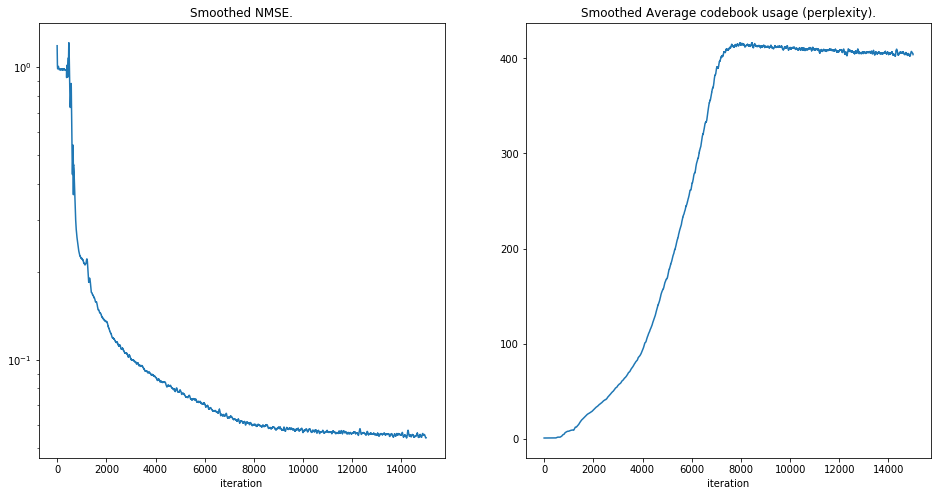

In [ ]:
f = plt.figure(figsize=(16,8))
ax = f.add_subplot(1,2,1)
ax.plot(train_res_recon_error_smooth)
ax.set_yscale('log')
ax.set_title('Smoothed NMSE.')
ax.set_xlabel('iteration')

ax = f.add_subplot(1,2,2)
ax.plot(train_res_perplexity_smooth)
ax.set_title('Smoothed Average codebook usage (perplexity).')
ax.set_xlabel('iteration')

## View Reconstructions

In [ ]:
model.eval()

(valid_originals, _) = next(iter(validation_loader))
valid_originals = valid_originals.to(device)

vq_output_eval = model._pre_vq_conv(model._encoder(valid_originals))
_, valid_quantize, _, _ = model._vq_vae(vq_output_eval)
valid_reconstructions = model._decoder(valid_quantize)

In [ ]:
(train_originals, _) = next(iter(training_loader))
train_originals = train_originals.to(device)
_, train_reconstructions, _, _ = model._vq_vae(train_originals)

In [ ]:
def show(img):
    npimg = img.numpy()
    fig = plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest')
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


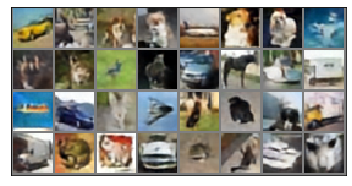

In [ ]:
show(make_grid(valid_reconstructions.cpu().data)+0.5, )

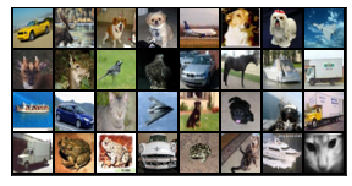

In [ ]:
show(make_grid(valid_originals.cpu()+0.5))

## View Embedding

In [ ]:
proj = umap.UMAP(n_neighbors=3,
                 min_dist=0.1,
                 metric='cosine').fit_transform(model._vq_vae._embedding.weight.data.cpu())

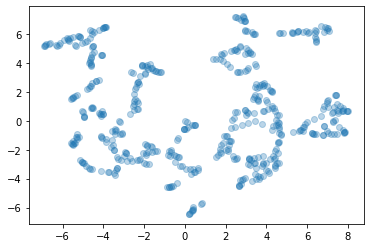

In [ ]:
plt.scatter(proj[:,0], proj[:,1], alpha=0.3)